Work was split between Jubin and Christian and me. We should be using the same (or very similar) code

## Final Assignment Overview: Working with Patient Records and Encounter Notes

In this final assignment, we’ll focus on patient records related to COVID-19 encounters. Our task is to analyze, process, and transform the data while applying the concepts we’ve covered throughout this course. Here's a detailed breakdown of the assignment:

What Are Encounter Notes?
An encounter note is a record that captures details about a patient’s visit with a doctor. It includes both structured and semi-structured information that is crucial for understanding the context of the visit. Here’s what an encounter note typically looks like:

```
AMBULATORY ENCOUNTER NOTE
Date of Service: March 2, 2020 15:45-16:30

DEMOGRAPHICS:
Name: Jeffrey Greenfelder
DOB: 1/16/2005
Gender: Male
Address: 428 Wiza Glen Unit 91, Springfield, Massachusetts 01104
Insurance: Guardian
MRN: 055ae6fc-7e18-4a39-8058-64082ca6d515

PERTINENT MEDICAL HISTORY:
- Obesity 

Recent Visit: Well child visit (2/23/2020)
Immunizations: Influenza vaccine (2/23/2020)

Recent Baseline (2/23/2020):
Height: 155.0 cm
Weight: 81.2 kg
BMI: 33.8 kg/m² (99.1th percentile)
BP: 123/80 mmHg
HR: 92/min
RR: 13/min

SUBJECTIVE:
Adolescent patient presents with multiple symptoms including:
- Cough
- Sore throat
- Severe fatigue
- Muscle pain
- Joint pain
- Fever
Never smoker. Symptoms began recently.

OBJECTIVE:
Vitals:
Temperature: 39.3°C (102.7°F)
Heart Rate: 131.1/min
Blood Pressure: 120/73 mmHg
Respiratory Rate: 27.6/min
O2 Saturation: 75.8% on room air
Weight: 81.2 kg

Laboratory/Testing:
Comprehensive Respiratory Panel:
- Influenza A RNA: Negative
- Influenza B RNA: Negative
- RSV RNA: Negative
- Parainfluenza virus 1,2,3 RNA: Negative
- Rhinovirus RNA: Negative
- Human metapneumovirus RNA: Negative
- Adenovirus DNA: Negative
- SARS-CoV-2 RNA: Positive

ASSESSMENT:
1. Suspected COVID-19 with severe symptoms
2. Severe hypoxemia requiring immediate intervention
3. Tachycardia (HR 131)
4. High-grade fever
5. Risk factors:
   - Obesity (BMI 33.8)
   - Adolescent age

PLAN:
1. Face mask provided for immediate oxygen support
2. Infectious disease care plan initiated
3. Close monitoring required due to:
   - Severe hypoxemia
   - Tachycardia
   - Age and obesity risk factors
4. Parent/patient education on:
   - Home isolation protocols
   - Warning signs requiring emergency care
   - Return precautions
5. Follow-up plan:
   - Daily monitoring during acute phase
   - Virtual check-ins as needed

Encounter Duration: 45 minutes
Encounter Type: Ambulatory
Provider: ID# e2c226c2-3e1e-3d0b-b997-ce9544c10528
Facility: 5103c940-0c08-392f-95cd-446e0cea042a
```


The enocuter contains

* General encounter information: 

  * When the encounter took place: Date and time of the visit.
  * Demographics: Patient’s age, gender, and unique medical record identifier.
  * Encounter details: The reason for the visit, diagnosis, and any associated costs.


* Semi-Structured Notes:

These notes mirror how doctors organize their thoughts and observations during an encounter. They generally follow a SOAP format:

* Subjective: The patient’s subjective description of their symptoms, feelings, and medical concerns.
* Objective: The doctor’s objective findings, including test results, measurements, or physical examination outcomes.
* Assessment: The doctor’s evaluation or diagnosis based on subjective and objective information.
* Plan: The proposed treatment plan, including medications, follow-ups, or other interventions.

While some encounter notes might include additional details, the majority conform to this semi-structured format, making them ideal for analysis and transformation.

* Goals for the Assignment

1. Transforming Encounter Notes:

Using an LLM to convert semi-structured encounter notes into a JSON format that organizes the information into structured fields. The JSON will include details such as demographics, encounter specifics, and the SOAP components of the note. Subsequently, you will need to transform the JSON data into a Parquet file, which is not only suitable for analysis in Spark but also ideal for storage later.
Here we will use the ML classificaition to assing the objective and assessment semi-structured fields into standardized, structured fields. The medical taxonomy for this task will be the one provided by the CDC, which defines standard codes for diagnoses, symptoms, procedures, and treatments. This step ensures the structured data aligns with domain-wide medical standards, making it interoperable and ready for deeper analysis.

The JSON format should capture the hierachies described in the structure below. 




2. Basic Analytics and Visualizations:
Using Apache Spark, perform comprehensive data analysis on the encounter data and create visualizations that reveal meaningful patterns. Your analysis must include:
- COVID-19 Case Demographics: Case breakdown by age ranges ([0-5], [6-10], [11-17], [18-30], [31-50], [51-70], [71+])
- Cumulative case count of Covid between the earliest case observed in the dataset and last case observed
- Symptoms for all COVID-19 patients versus patients that admitted into the intensive care unit due to COVID.
- Rank medications by frequency of prescription
- Analyze medication patterns across different demographic groups (e.g., top 3 per age group)
- Identify and plot co-morbidity information from the patient records (e.g., hypertension, obesity, prediabetes, etc.) provided in the dataset. 
- An independent group analysis: You need to develop and execute THREE original analyses that provide meaningful insights about COVID-19 patterns in this dataset. For each analysis:
  - Clearly state your analytical question/hypothesis
  - Justify why this analysis is valuable
  - Show your Spark code and methodology
  - Present results with appropriate visualizations


In [0]:
EncounterType:
    code
    description

Encounter:
    #id
    date
    time
    #type: EncounterType
    provider_id
    facility_id

Address:
    city
    state

Demographics:
    #id
    name
    date_of_birth
    age
    gender
    address: Address
    insurance

Condition:
    code
    description

Medication:
    code
    description

Immunization:
    code
    description
    date: date

VitalMeasurement:
    code
    value: float
    unit

BloodPressure:
    systolic: VitalMeasurement
    diastolic: VitalMeasurement

CurrentVitals:
    temperature: VitalMeasurement
    heart_rate: VitalMeasurement
    blood_pressure: BloodPressure
    respiratory_rate: VitalMeasurement
    oxygen_saturation: VitalMeasurement
    weight: VitalMeasurement

BaselineVitals:
    date: date
    height: VitalMeasurement
    weight: VitalMeasurement
    bmi: VitalMeasurement
    bmi_percentile: VitalMeasurement

Vitals:
    current: CurrentVitals
    baseline: BaselineVitals

RespiratoryTest:
    code
    result

RespiratoryPanel:
    influenza_a: RespiratoryTest
    influenza_b: RespiratoryTest
    rsv: RespiratoryTest
    parainfluenza_1: RespiratoryTest
    parainfluenza_2: RespiratoryTest
    parainfluenza_3: RespiratoryTest
    rhinovirus: RespiratoryTest
    metapneumovirus: RespiratoryTest
    adenovirus: RespiratoryTest

Covid19Test:
    code
    description
    result

Laboratory:
    covid19: Covid19Test
    respiratory_panel: RespiratoryPanel

Procedure:
    code
    description
    date: date
    reasonCode
    reasonDescription

CarePlan:
    code
    description
    start: date
    stop: date
    reasonCode
    reasonDescription

PatientRecord:
    encounter: Encounter
    demographics: Demographics
    conditions: List[Condition]
    medications: List[Medication]
    immunizations: List[Immunization]
    vitals: Vitals
    laboratory: Laboratory
    procedures: List[Procedure]


  File <command-1290198607911239>, line 1
    EncounterType:
                  ^
SyntaxError: invalid syntax


In [0]:
%pip install pydantic -U
%pip install faiss-cpu
%pip install langchain-openai
%pip install -U sentence-transformers
#%pip install pandas pyarrow
#%restart_python

  Obtaining dependency information for pydantic from https://files.pythonhosted.org/packages/62/51/72c18c55cf2f46ff4f91ebcc8f75aa30f7305f3d726be3f4ebffb4ae972b/pydantic-2.10.3-py3-none-any.whl.metadata
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0.0/172.0 kB ? eta -:--:--
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━━━━━━━━ 122.9/172.0 kB 3.5 MB/s eta 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 172.0/172.0 kB 3.4 MB/s eta 0:00:00
  Obtaining dependency information for annotated-types>=0.6.0 from https://files.pythonhosted.org/packages/78/b6/6307fbef88d9b5ee7421e68d78a9f162e0da4900bc5f5793f6d3d0e34fb8/annotated_types-0.7.0-py3-none-any.whl.metadata
  Obtaining dependency information for pydantic-core==2.27.1 from https://files.pythonhosted.org/packages/4a/c1/3e38cd777ef832c4fdce11d204592e135ddeedb6c6f525478a53d1c7d3e5/pydantic_core-2.27.1-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata
  Obtaining dependency information for typing-extensions>=4.12.2 from https://f

In [0]:
%restart_python

In [0]:
from pydantic import BaseModel, Field, ValidationError
from typing import List, Optional
import datetime
import faiss
from langchain_openai import ChatOpenAI
from sentence_transformers import SentenceTransformer
import pyspark.sql.functions as f
import pandas as pd
import numpy as np

import pyarrow as pa
import pyarrow.parquet as pq
from pyspark.sql import SparkSession
import pyspark
import json
from pyspark.sql.types import *

import matplotlib.pyplot as plt

In [0]:
# Retreive all the paths of encounter notes from the folder 
notes_paths = sc.wholeTextFiles('dbfs:/FileStore/assignment_3/encounter_notes/*.txt').map(lambda x: x[0]).collect()
notes_paths

['dbfs:/FileStore/assignment_3/encounter_notes/055ae6fc_7e18_4a39_8058_64082ca6d515.txt',
 'dbfs:/FileStore/assignment_3/encounter_notes/199c586f_af16_4091_9998_ee4cfc02ee7a.txt',
 'dbfs:/FileStore/assignment_3/encounter_notes/28658715_b770_4576_9a81_fbb2282a98ea.txt',
 'dbfs:/FileStore/assignment_3/encounter_notes/353016ea_a0ff_4154_85bb_1cf8b6cedf20.txt',
 'dbfs:/FileStore/assignment_3/encounter_notes/ae9efba3_ddc4_43f9_a781_f72019388548.txt',
 'dbfs:/FileStore/assignment_3/encounter_notes/b9fd2dd8_181b_494b_ab15_e9f286d668d9.txt',
 'dbfs:/FileStore/assignment_3/encounter_notes/d22592ac_552f_4ecd_a63d_7663d77ce9ba.txt',
 'dbfs:/FileStore/assignment_3/encounter_notes/df6b563d_1ff4_4833_9af8_84431e641e9c.txt',
 'dbfs:/FileStore/assignment_3/encounter_notes/f0f3bc8d_ef38_49ce_a2bd_dfdda982b271.txt',
 'dbfs:/FileStore/assignment_3/encounter_notes/f73d6f41_0091_4485_8b43_9d38eb98fb36.txt']

In [0]:
notes_paths[0][-40:-4]

'055ae6fc_7e18_4a39_8058_64082ca6d515'

In [0]:
# Iterating the notes_paths list. Read the textfile and append it into notes_files list.
notes_files = []
for path in notes_paths:
  notes_files.append(spark.read.text(path, wholetext=True).collect()[0].value)


In [0]:
print(notes_files[1])

URGENT CARE ENCOUNTER NOTE
Date of Service: March 2, 2020 04:15-05:15

DEMOGRAPHICS:
Name: Jimmie Harris
DOB: 1/9/2004 (16y/o)
Gender: Female
Address: Pembroke, MA
Insurance: Medicare/Medicaid
MRN: 199c586f-af16-4091-9998-ee4cfc02ee7a

PERTINENT MEDICAL HISTORY:
No significant past medical history
Current Medications:
- Jolivette (oral contraceptive)
Last Visit: Well child visit (2/22/2020)
Immunizations: 
- Influenza vaccine (2/21/2020)
- Meningococcal vaccine (2/21/2020)

Recent Labs (2/21/2020):
CBC Results:
- WBC: 7.9 K/uL
- RBC: 4.6 M/uL
- Hemoglobin: 12.6 g/dL
- Hematocrit: 46.5%
- Platelets: 398.3 K/uL

SUBJECTIVE:
Previously healthy adolescent presents with fever, productive cough with sputum, nausea, and vomiting. Symptoms began yesterday. The patient has no history of smoking and reports no known contacts with COVID-19.

OBJECTIVE:
Vitals:
Temperature: 40.7°C (105.3°F)
Heart Rate: 98/min
Blood Pressure: 120/89 mmHg
Respiratory Rate: 22/min
O2 Saturation: 78.2% on room air
Wei

In [0]:
# Pydantic base models
class EncounterType(BaseModel):
    code: Optional[str] = Field(None, description='the code of the encounter type')
    description: Optional[str] = Field(None, description='the description of the encounter type')

class Encounter(BaseModel):
    date: Optional[str] = Field(None, description="the date of encounter the patient")
    time: Optional[str] = Field(None, description="the start time of the encounter of the patient")
    encounter_type: Optional[EncounterType]
    provider_id: Optional[str] = Field(None, description='the provider ID. Locate next to Provider header')
    facility_id: Optional[str] = Field(None, description='the facility ID. Locate next to Facility header')

class Address(BaseModel):
    city: Optional[str] = Field(None, description="the city where the patient lives. Should be under DEMOGRAPHICS header")
    state: Optional[str] = Field(None, description="the state wehre the patient lives. Should be under DEMOGRAPHICS header")

class Demographics(BaseModel):
    name: Optional[str] = Field(None, description='the name of the patient')
    date_of_birth: Optional[str] = Field(None, description="the date of birth of the patient")
    age: Optional[int] = Field(None, description="the age of the patient. If does not exist on text, calculate based on the date of birth.")
    gender: Optional[str] = Field(None, description='the gender of the patient')
    address: Optional[Address] = Field(None, description='the address of the patient')
    insurance: Optional[str] = Field(None, description="insurance of the patient.")

class Condition(BaseModel):
    code: Optional[str] = Field(None, description='the code of the condition')
    description: Optional[str] = Field(None, description='the description of the condition')

class Medication(BaseModel):
    code: Optional[str] = Field(None, description='the code of the medication. retrieve the code from the list provided below if it exists')
    description: Optional[str] = Field(None, description="the complete name of the medication. Should be under PERTINENT MEDICAL HISTORY")

class Immunization(BaseModel):
    code: Optional[str]
    description: Optional[str]
    date: Optional[str] = Field(None, description='the date when the immunization has conducted')

class VitalMeasurement(BaseModel):
    code: Optional[str]
    value: Optional[float]
    unit: Optional[str]

class BloodPressure(BaseModel):
    systolic: Optional[VitalMeasurement]
    diastolic: Optional[VitalMeasurement]

class CurrentVitals(BaseModel):
    temperature: Optional[VitalMeasurement] = Field(None, description='the current temperature of the patient. Record celsius (C) if both celsius and fahrenheit is shown')
    heart_rate: Optional[VitalMeasurement]
    blood_pressure: Optional[BloodPressure]
    respiratory_rate: Optional[VitalMeasurement]
    oxygen_saturation: Optional[VitalMeasurement]
    weight: Optional[VitalMeasurement]

class BaselineVitals(BaseModel):
    date: Optional[str] = Field(None, description="the date of baseline vitals conducted")
    height: Optional[VitalMeasurement] = Field(None, description="the height of the patient")
    weight: Optional[VitalMeasurement] = Field(None, description="the weight of the patient")
    bmi: Optional[VitalMeasurement] = Field(None, description="the bmi (body mass index) value of the patient.")
    bmi_percentile: Optional[VitalMeasurement] = Field(None, description="the percentile of bmi (body mass index)")

class Vitals(BaseModel):
    current: Optional[CurrentVitals] = Field(None, description='the current vitals of the patient')
    baseline: Optional[BaselineVitals] = Field(None, description='the baseline vitals of the patient')

class RespiratoryTest(BaseModel):
    code: Optional[str] = Field(None, description='the code of respiratory test')
    result: Optional[str] = Field(None, description='the result of respiratory test')

class RespiratoryPanel(BaseModel):
    influenza_a: Optional[RespiratoryTest] = Field(None, description='the respriatory test for infruenza a')
    influenza_b: Optional[RespiratoryTest] = Field(None, description='the respriatory test for infruenza b')
    rsv: Optional[RespiratoryTest] = Field(None, description='the respriatory test for rsv')
    parainfluenza_1: Optional[RespiratoryTest] = Field(None, description='the respriatory test for parainfluenza 1')
    parainfluenza_2: Optional[RespiratoryTest] = Field(None, description='the respriatory test for parainfluenza 2')
    parainfluenza_3: Optional[RespiratoryTest] = Field(None, description='the respriatory test for parainfluenza 3')
    rhinovirus: Optional[RespiratoryTest] = Field(None, description='the respriatory test for rhinovirus')
    metapneumovirus: Optional[RespiratoryTest] = Field(None, description='the respriatory test for metapneumovirus')
    adenovirus: Optional[RespiratoryTest] = Field(None, description='the respriatory test for adenovirus')

class Covid19Test(BaseModel):
    code: Optional[str]
    description: Optional[str]
    result: Optional[str]

class Laboratory(BaseModel):
    covid19: Optional[Covid19Test]
    respiratory_panel: RespiratoryPanel

class Procedure(BaseModel):
    code: Optional[str] 
    description: Optional[str] = Field(None, description="the description of the each step under PLAN. usually listed with numbers.")
    date: Optional[str] = Field(None, description="the date of the procedure if available")
    reasonCode: Optional[str]
    reasonDescription: Optional[str]

class CarePlan(BaseModel):  
    code: Optional[str]
    description: Optional[str]
    start: Optional[str] = Field(None, description="the start date of the care plan")
    stop: Optional[str] = Field(None, description="the end (stop) date of the care plan")
    reasonCode: Optional[str]
    reasonDescription: Optional[str]

class PatientRecord(BaseModel):
    encounter: Encounter
    demographics: Demographics
    conditions: List[Condition]
    medications: List[Medication]
    immunizations: List[Immunization]
    vitals: Optional[Vitals] 
    laboratory: Optional[Laboratory]
    procedures: List[Procedure] = Field(None, description='the complete list of procedures with no missing. Should be under PLAN')


class MedOnly(BaseModel):
    """
    BaseModel to retrieve medications only for contextual prompting 
    - Specifically used MedOnly to reduce token usage for part 1 of this assignment
    """
    medications: List[Medication]



In [0]:
llm_model = ChatOpenAI(
    model="gpt-4o",
    temperature=0, # For consistent and accurate outputs 
    api_key="",
)

In [0]:
encode_model = SentenceTransformer("all-MiniLM-L6-v2")

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.7k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

In [0]:
schema = StructType(
  [StructField("CODE", StringType(), True),
  StructField("DESCRIPTION", StringType(), True)]
)

meds = spark.read.csv('dbfs:/FileStore/assignment_3/medications_assignment_1.csv', schema=schema, header=True)

In [0]:
# create a pandas udf that will encode the text and return an array of doubles
@f.pandas_udf(returnType=ArrayType(FloatType()))
def encode(x: pd.Series) -> pd.Series:
    return pd.Series(encode_model.encode(x).tolist())

meds_embed = meds.withColumn("embedding", encode(f.col("DESCRIPTION")))


In [0]:
dim = len(meds_embed.take(1)[0][2])
meds_index = faiss.IndexFlatIP(dim)

meds_index.ntotal, dim

(0, 384)

In [0]:
for med in meds_embed.collect():
  meds_index.add(np.expand_dims(med.embedding, axis=0))

meds_index.ntotal

176

In [0]:
def retrieve_medication_code(encode_model, meds_index, result, k, meds_list):
  """
  Function to retreieve the relevant code and descriptions based on descriptions of the medications
  Input:
    encode_model (SentenceTransformer): embedding model using for converting descriptions from result to embedding
    meds_index (fais.index): faiss index that a complete list of descriptions have embedded into
    result (Object): result from the llm including medications list
    k (int): number of closest code/descriptions to search
    meds_list (list): complete list of medications containing code and description
  Return:
    code_note (list): A list that consists of rows that contains code and descriptoins of medications that are relevant
                      to input medications
  """
  code_note = []

  for med in result.medications:
    desc_embedding = encode_model.encode([med.description]) # embed the medication description from the result
    faiss.normalize_L2(desc_embedding) # normalize it
    _, indicies = meds_index.search(desc_embedding, k=k) # perform serach 
    for index in indicies[0]:
      code_note.append(meds_list[index]) # append the medication code with description 

  return code_note

In [0]:
def get_json_patient_record(patient_record, llm_model, med_basemodel, patient_basemodel, meds_list):
  """
  Function to retrieve patient record from text file and convert it into json file format
  Input:
    patient_record (str): Text file that contains the record of patient note
    llm_model : the large langauge model (like GPT) for processing
    med_basemodel (pydantic.Basemodel): pydantic basemodel for retrieiving medication information 
    patient_basemodel (pydantic.Basemodel): pydantic basemodel for retrieiving general patient information
    meds_list (list): the list of medicaitons with codes and descriptions
  Returns:
    patient_json (dict): JSON file format of patient record structured based on the pydantic basemodel
  """

  # retrieve medications' code and description
  med_record_model = llm_model.with_structured_output(med_basemodel) 
  med_result = med_record_model.invoke(patient_record)
  med_note = retrieve_medication_code(encode_model=encode_model, meds_index=meds_index, result=med_result, k=3, meds_list=meds_list)

  add_med_info = ""
  if len(med_note) > 0: # Only when result contains medications for reducing token usage
    add_med_info += "Here is the list of code and description of medications that would be useful to find the medication code based on the patient's medication history.\nChoose the correct CODE based on the description, be careful to match the dose of medications and no put attention to name(s) of the medications in description (do not miss any medications above the note)\n"
  
    for med in med_note:
      add_med_info += med.CODE + "," + med.DESCRIPTION + "\n"
    
  
  patient_record_model = llm_model.with_structured_output(patient_basemodel)
  try:
    patient_result = patient_record_model.invoke(patient_record + add_med_info)
  except ValidationError:
    print("ERROR occured in pydantic validation")
    return -1

  json_format = llm_model.invoke(str(patient_result) + "nReturn the output in JSON file format ONLY. NO additional information or comments at all")

  try:
    patient_json = json.loads(json_format.content.replace('```json\n', '').replace('```', ''))
  except:
    print("ERROR occured when converting it into JSON file")
    return -1

  return patient_json
  
#json_file_7 = get_json_patient_record(notes_files[7], llm_model=llm_model, med_basemodel=MedOnly, patient_basemodel=PatientRecord)



In [0]:
meds_list = meds.collect()
patient_json_list = []
# Iterate the notes and pass the function. Append the json files in the list
for i, patient_note in enumerate(notes_files):
  json_patient_note = get_json_patient_record(patient_record=patient_note, llm_model=llm_model, med_basemodel=MedOnly, patient_basemodel=PatientRecord, meds_list=meds_list)
  if json_patient_note == -1: # Error tracking step
    print(f"ERROR Occured at note id: {notes_paths[i][-40:-4]}")
  else:
    patient_json_list.append(json_patient_note)

In [0]:
patient_json_list[0]

{'encounter': {'date': '2020-03-02',
  'time': '15:45-16:30',
  'encounter_type': {'code': None, 'description': 'Ambulatory'},
  'provider_id': 'e2c226c2-3e1e-3d0b-b997-ce9544c10528',
  'facility_id': '5103c940-0c08-392f-95cd-446e0cea042a'},
 'demographics': {'name': 'Jeffrey Greenfelder',
  'date_of_birth': '2005-01-16',
  'age': None,
  'gender': 'Male',
  'address': {'city': 'Springfield', 'state': 'Massachusetts'},
  'insurance': 'Guardian'},
 'conditions': [{'code': None, 'description': 'Obesity'}],
 'medications': [],
 'immunizations': [{'code': None,
   'description': 'Influenza vaccine',
   'date': '2020-02-23'}],
 'vitals': {'current': {'temperature': {'code': None,
    'value': 39.3,
    'unit': 'C'},
   'heart_rate': {'code': None, 'value': 131.1, 'unit': 'min'},
   'blood_pressure': {'systolic': {'code': None,
     'value': 120.0,
     'unit': 'mmHg'},
    'diastolic': {'code': None, 'value': 73.0, 'unit': 'mmHg'}},
   'respiratory_rate': {'code': None, 'value': 27.6, 'unit

In [0]:
patient_json_list[7]

{'encounter': {'date': '2020-03-13',
  'time': '16:12-17:11',
  'encounter_type': {'code': None, 'description': 'Ambulatory/Urgent Care'},
  'provider_id': 'd76028b8-d23f-346e-abd0-65995aec66c8',
  'facility_id': None},
 'demographics': {'name': 'Ms. Brown',
  'date_of_birth': '1982-09-29',
  'age': 37,
  'gender': 'Female',
  'address': {'city': 'Boston', 'state': 'MA'},
  'insurance': 'Medicare/Medicaid'},
 'conditions': [{'code': None, 'description': 'Pulmonary emphysema'},
  {'code': None, 'description': 'Hypertension'},
  {'code': None,
   'description': 'Multiple allergies (bee venom, grass/tree pollen, fish)'}],
 'medications': [{'code': '429503',
   'description': 'Hydrochlorothiazide 12.5 MG daily'},
  {'code': '896209',
   'description': 'Fluticasone/Salmeterol 250/50 mcg inhaler BID'}],
 'immunizations': [{'code': None,
   'description': 'Influenza vaccine',
   'date': '2020-03-11'}],
 'vitals': {'current': {'temperature': {'code': None,
    'value': 40.6,
    'unit': 'C'},


In [0]:
# Building structure for parquet format
encounter_type_schema = StructType([
  StructField("code", StringType(), True),
  StructField("description", StringType(), True)
])

address_schema = StructType([
  StructField("city", StringType(), True),
  StructField("state", StringType(), True)
])

demographics_schema = StructType([
  StructField("name", StringType(), True),
  StructField("date_of_birth", StringType(), True),
  StructField("age", IntegerType(), True),
  StructField("gender", StringType(), True),
  StructField("address", address_schema, True),
  StructField("insurance", StringType(), True)
])

encounter_schema = StructType([
  StructField("date", StringType(), True),
  StructField("time", StringType(), True),
  StructField("provider_id", StringType(), True),
  StructField("facility_id", StringType(), True)
])

vital_measurement_schema = StructType([
  StructField("code", StringType(), True),
  StructField("value", FloatType(), True),
  StructField("unit", StringType(), True)
])

blood_pressure_schema = StructType([
  StructField("systolic", vital_measurement_schema, True),
  StructField("diastolic", vital_measurement_schema, True)
])

current_vitals_schema = StructType([
  StructField("temperature", vital_measurement_schema, True),
  StructField("heart_rate", vital_measurement_schema, True),
  StructField("blood_pressure", blood_pressure_schema, True),
  StructField("respiratory_rate", vital_measurement_schema, True),
  StructField("oxygen_saturation", vital_measurement_schema, True),
  StructField("weight", vital_measurement_schema, True)
])

baseline_vitals_schema = StructType([
  StructField("date", StringType(), True),
  StructField("height", vital_measurement_schema, True),
  StructField("weight", vital_measurement_schema, True),
  StructField("bmi", vital_measurement_schema, True),
  StructField("bmi_percentile", vital_measurement_schema, True)
])

vitals_schema = StructType([
  StructField("current", current_vitals_schema, True),
  StructField("baseline", baseline_vitals_schema, True)
])

    # Schemas for other nested structures
condition_schema = StructType([
  StructField("code", StringType(), True),
  StructField("description", StringType(), True)
])

medication_schema = StructType([
  StructField("code", StringType(), True),
  StructField("description", StringType(), True)
])

immunization_schema = StructType([
  StructField("code", StringType(), True),
  StructField("description", StringType(), True),
  StructField("date", StringType(), True)
])

respiratory_test_schema = StructType([
  StructField("code", StringType(), True),
  StructField("result", StringType(), True)
])

respiratory_panel_schema = StructType([
  StructField("influenza_a", respiratory_test_schema, True),
  StructField("influenza_b", respiratory_test_schema, True),
  StructField("rsv", respiratory_test_schema, True),
  StructField("parainfluenza_1", respiratory_test_schema, True),
  StructField("parainfluenza_2", respiratory_test_schema, True),
  StructField("parainfluenza_3", respiratory_test_schema, True),
  StructField("rhinovirus", respiratory_test_schema, True),
  StructField("metapneumovirus", respiratory_test_schema, True),
  StructField("adenovirus", respiratory_test_schema, True)
])

covid19_test_schema = StructType([
  StructField("code", StringType(), True),
  StructField("description", StringType(), True),
  StructField("result", StringType(), True)
])

laboratory_schema = StructType([
  StructField("covid19", covid19_test_schema, True),
  StructField("respiratory_panel", respiratory_panel_schema, True)
])

procedure_schema = StructType([
  StructField("code", StringType(), True),
  StructField("description", StringType(), True),
  StructField("date", StringType(), True),
  StructField("reasonCode", StringType(), True),
  StructField("reasonDescription", StringType(), True)
])

# Full Patient Record Schema
patient_record_schema = StructType([
  StructField("encounter", encounter_schema, True),
  StructField("demographics", demographics_schema, True),
  StructField("conditions", ArrayType(condition_schema), True),
  StructField("medications", ArrayType(medication_schema), True),
  StructField("immunizations", ArrayType(immunization_schema), True),
  StructField("vitals", vitals_schema, True),
  StructField("laboratory", laboratory_schema, True),
  StructField("procedures", ArrayType(procedure_schema), True)
])

In [0]:
# unzip the gz file locally and throw into dbfs
df = spark.read.json('dbfs:/FileStore/assignment_3/parsed_notes.jsonl', schema=patient_record_schema)

In [0]:
df.take(1)[0]

Row(encounter=Row(date='2020-03-18', time='21:03:20', provider_id='b8a245a1-de55-3ff1-ad90-633d8411c1c5', facility_id='3278c48a-aff0-3325-ba4a-5bb3eae5304c'), demographics=Row(name='Elmer Schinner', date_of_birth='1993-06-16', age=31, gender='M', address=Row(city='Boston', state='Massachusetts'), insurance='Self'), conditions=[Row(code='49727002', description='Cough (finding)'), Row(code='267036007', description='Dyspnea (finding)'), Row(code='56018004', description='Wheezing (finding)'), Row(code='267060006', description='Diarrhea symptom (finding)'), Row(code='386661006', description='Fever (finding)'), Row(code='36955009', description='Loss of taste (finding)'), Row(code='840544004', description='Suspected COVID-19'), Row(code='840539006', description='COVID-19'), Row(code='233604007', description='Pneumonia (disorder)'), Row(code='389087006', description='Hypoxemia (disorder)'), Row(code='271825005', description='Respiratory distress (finding)'), Row(code='65710008', description='A

In [0]:
df.printSchema()

root
 |-- encounter: struct (nullable = true)
 |    |-- date: string (nullable = true)
 |    |-- time: string (nullable = true)
 |    |-- provider_id: string (nullable = true)
 |    |-- facility_id: string (nullable = true)
 |-- demographics: struct (nullable = true)
 |    |-- name: string (nullable = true)
 |    |-- date_of_birth: string (nullable = true)
 |    |-- age: integer (nullable = true)
 |    |-- gender: string (nullable = true)
 |    |-- address: struct (nullable = true)
 |    |    |-- city: string (nullable = true)
 |    |    |-- state: string (nullable = true)
 |    |-- insurance: string (nullable = true)
 |-- conditions: array (nullable = true)
 |    |-- element: struct (containsNull = true)
 |    |    |-- code: string (nullable = true)
 |    |    |-- description: string (nullable = true)
 |-- medications: array (nullable = true)
 |    |-- element: struct (containsNull = true)
 |    |    |-- code: string (nullable = true)
 |    |    |-- description: string (nullable = tru

In [0]:
df.coalesce(1).write.mode("overwrite").parquet('dbfs:/FileStore/assignment_3/records_parquet')

In [0]:
# creates file
dbutils.fs.ls('dbfs:/FileStore/assignment_3/records_parquet')

[FileInfo(path='dbfs:/FileStore/assignment_3/records_parquet/_SUCCESS', name='_SUCCESS', size=0, modificationTime=1734499753000),
 FileInfo(path='dbfs:/FileStore/assignment_3/records_parquet/_committed_610472366290516605', name='_committed_610472366290516605', size=231, modificationTime=1734499753000),
 FileInfo(path='dbfs:/FileStore/assignment_3/records_parquet/_committed_7941696398621389580', name='_committed_7941696398621389580', size=144, modificationTime=1734492612000),
 FileInfo(path='dbfs:/FileStore/assignment_3/records_parquet/_started_610472366290516605', name='_started_610472366290516605', size=0, modificationTime=1734499747000),
 FileInfo(path='dbfs:/FileStore/assignment_3/records_parquet/parsed_notes.jsonl', name='parsed_notes.jsonl', size=4481771, modificationTime=1734499690000),
 FileInfo(path='dbfs:/FileStore/assignment_3/records_parquet/part-00000-tid-610472366290516605-d42994d9-c836-404f-be0b-1415f6c727e6-1-1-c000.snappy.parquet', name='part-00000-tid-61047236629051660

In [0]:
# copy paste the file path into here
my_parquet = spark.read.parquet('dbfs:/FileStore/assignment_3/records_parquet/part-00000-tid-610472366290516605-d42994d9-c836-404f-be0b-1415f6c727e6-1-1-c000.snappy.parquet')

In [0]:
display(my_parquet)

encounter demographics conditions medications immunizations vitals laboratory procedures List(2020-03-18, 21:03:20, b8a245a1-de55-3ff1-ad90-633d8411c1c5, 3278c48a-aff0-3325-ba4a-5bb3eae5304c) List(Elmer Schinner, 1993-06-16, 31, M, List(Boston, Massachusetts), Self) List(List(49727002, Cough (finding)), List(267036007, Dyspnea (finding)), List(56018004, Wheezing (finding)), List(267060006, Diarrhea symptom (finding)), List(386661006, Fever (finding)), List(36955009, Loss of taste (finding)), List(840544004, Suspected COVID-19), List(840539006, COVID-19), List(233604007, Pneumonia (disorder)), List(389087006, Hypoxemia (disorder)), List(271825005, Respiratory distress (finding)), List(65710008, Acute respiratory failure (disorder)), List(770349000, Sepsis caused by virus (disorder)), List(706870000, Acute pulmonary embolism (disorder))) List(List(854235, 0.4 ML Enoxaparin sodium 100 MG/ML Prefilled Syringe), List(2123111, NDA020503 200 ACTUAT Albuterol 0.09 MG/ACTUAT Metered Dose Inhaler), List(198440, Acetaminophen 500 MG Oral Tablet), List(854252, 1 ML Enoxaparin sodium 150 MG/ML Prefilled Syringe)) List() List(List(List(8310-5, 38.1, Cel), List(8867-4, 59.4, /min), List(List(8480-6, 109.0, mm[Hg]), List(8462-4, 77.0, mm[Hg])), List(9279-1, 34.7, /min), List(2708-6, 76.3, %), List(29463-7, 106.5, kg)), null) List(List(94531-1, SARS-CoV-2 RNA Pnl Resp NAA+probe, Detected (qualifier value)), List(List(92142-9, Negative (qualifier value)), List(92141-1, Negative (qualifier value)), null, null, null, null, null, null, null)) List(List(261352009, Face mask (physical object), 2020-03-02, 840544004, Suspected COVID-19), List(399208008, Plain chest X-ray (procedure), 2020-03-02, , ), List(371908008, Oxygen administration by mask (procedure), 2020-03-02, 389087006, Hypoxemia (disorder)), List(431182000, Placing subject in prone position (procedure), 2020-03-02, 389087006, Hypoxemia (disorder)), List(371908008, Oxygen administration by mask (procedure), 2020-03-03, 389087006, Hypoxemia (disorder)), List(431182000, Placing subject in prone position (procedure), 2020-03-03, 389087006, Hypoxemia (disorder)), List(371908008, Oxygen administration by mask (procedure), 2020-03-04, 389087006, Hypoxemia (disorder)), List(431182000, Placing subject in prone position (procedure), 2020-03-04, 389087006, Hypoxemia (disorder)), List(371908008, Oxygen administration by mask (procedure), 2020-03-05, 389087006, Hypoxemia (disorder)), List(431182000, Placing subject in prone position (procedure), 2020-03-05, 389087006, Hypoxemia (disorder)), List(371908008, Oxygen administration by mask (procedure), 2020-03-06, 389087006, Hypoxemia (disorder)), List(431182000, Placing subject in prone position (procedure), 2020-03-06, 389087006, Hypoxemia (disorder)), List(371908008, Oxygen administration by mask (procedure), 2020-03-07, 389087006, Hypoxemia (disorder)), List(431182000, Placing subject in prone position (procedure), 2020-03-07, 389087006, Hypoxemia (disorder)), List(371908008, Oxygen administration by mask (procedure), 2020-03-08, 389087006, Hypoxemia (disorder)), List(431182000, Placing subject in prone position (procedure), 2020-03-08, 389087006, Hypoxemia (disorder))) List(2020-05-22, 20:59:35, 2c6b08cf-0e34-37bf-9447-2823cc00073e, 2a4518d8-7014-3404-b2e9-1c30c76b6a12) List(Albert Kshleri, 2013-05-31, 11, M, List(Chelsea, Massachusetts), Self) List(List(49727002, Cough (finding)), List(267036007, Dyspnea (finding)), List(56018004, Wheezing (finding)), List(386661006, Fever (finding)), List(36955009, Loss of taste (finding)), List(840544004, Suspected COVID-19), List(840539006, COVID-19)) List() List(List(140, Influenza seasonal injectable preservative free, 2020-05-22)) List(List(List(8310-5, 39.2, Cel), List(8867-4, 63.0, /min), List(List(8480-6, 111.0, mm[Hg]), List(8462-4, 74.0, mm[Hg])), List(9279-1, 13.0, /min), List(2708-6, 77.4, %), List(29463-7, 27.6, kg)), List(2020-05-22, List(8302-2, 131.7, cm), null, null, null)) List(List(94531-1, SARS-

In [0]:
# COVID-19 Case Demographics: Case breakdown by age ranges ([0-5], [6-10], [11-17], [18-30], [31-50], [51-70], [71+])
covid_positive = my_parquet.filter((f.col('laboratory.covid19.result') == 'Detected (qualifier value)'))
  
covid_0_to_5 = covid_positive.filter((f.col('demographics.age') <= 5)).count()
covid_6_to_10 = covid_positive.filter((f.col('demographics.age') >= 6) & (f.col('demographics.age') <= 10)).count()
covid_11_to_17 = covid_positive.filter((f.col('demographics.age') >= 11) & (f.col('demographics.age') >= 17)).count()
covid_18_to_30 = covid_positive.filter((f.col('demographics.age') >= 18) & (f.col('demographics.age') >= 30)).count()
covid_31_to_50 = covid_positive.filter((f.col('demographics.age') >= 31) & (f.col('demographics.age') >= 50)).count()
covid_51_to_70 = covid_positive.filter((f.col('demographics.age') >= 51) & (f.col('demographics.age') >= 70)).count()
covid_above_71 = covid_positive.filter((f.col('demographics.age') >= 71)).count()

In [0]:
age_group = ['0-5','6-10', '11-17', '18-30', '31-50', '51-70', '71+']
covid_count = [covid_0_to_5, covid_6_to_10, covid_11_to_17, covid_18_to_30, covid_31_to_50, covid_51_to_70, covid_above_71]

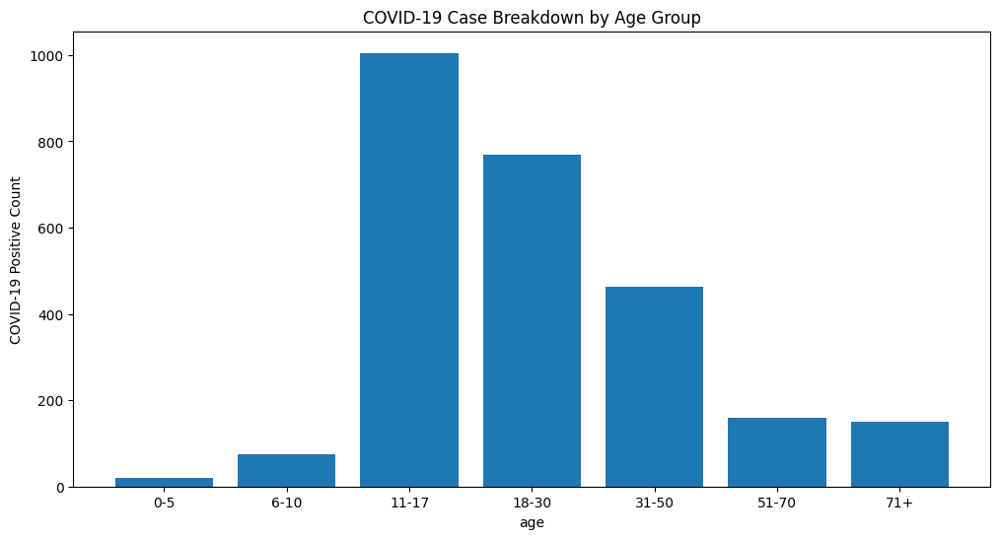

In [0]:
plt.figure(figsize=(12, 6))
plt.xlabel('age')
plt.ylabel('COVID-19 Positive Count')
plt.title('COVID-19 Case Breakdown by Age Group')
_ = plt.bar(age_group, covid_count)


In [0]:
display(covid_positive)

encounter,demographics,conditions,medications,immunizations,vitals,laboratory,procedures
"List(2020-03-18, 21:03:20, b8a245a1-de55-3ff1-ad90-633d8411c1c5, 3278c48a-aff0-3325-ba4a-5bb3eae5304c)","List(Elmer Schinner, 1993-06-16, 31, M, List(Boston, Massachusetts), Self)","List(List(49727002, Cough (finding)), List(267036007, Dyspnea (finding)), List(56018004, Wheezing (finding)), List(267060006, Diarrhea symptom (finding)), List(386661006, Fever (finding)), List(36955009, Loss of taste (finding)), List(840544004, Suspected COVID-19), List(840539006, COVID-19), List(233604007, Pneumonia (disorder)), List(389087006, Hypoxemia (disorder)), List(271825005, Respiratory distress (finding)), List(65710008, Acute respiratory failure (disorder)), List(770349000, Sepsis caused by virus (disorder)), List(706870000, Acute pulmonary embolism (disorder)))","List(List(854235, 0.4 ML Enoxaparin sodium 100 MG/ML Prefilled Syringe), List(2123111, NDA020503 200 ACTUAT Albuterol 0.09 MG/ACTUAT Metered Dose Inhaler), List(198440, Acetaminophen 500 MG Oral Tablet), List(854252, 1 ML Enoxaparin sodium 150 MG/ML Prefilled Syringe))",List(),"List(List(List(8310-5, 38.1, Cel), List(8867-4, 59.4, /min), List(List(8480-6, 109.0, mm[Hg]), List(8462-4, 77.0, mm[Hg])), List(9279-1, 34.7, /min), List(2708-6, 76.3, %), List(29463-7, 106.5, kg)), null)","List(List(94531-1, SARS-CoV-2 RNA Pnl Resp NAA+probe, Detected (qualifier value)), List(List(92142-9, Negative (qualifier value)), List(92141-1, Negative (qualifier value)), null, null, null, null, null, null, null))","List(List(261352009, Face mask (physical object), 2020-03-02, 840544004, Suspected COVID-19), List(399208008, Plain chest X-ray (procedure), 2020-03-02, , ), List(371908008, Oxygen administration by mask (procedure), 2020-03-02, 389087006, Hypoxemia (disorder)), List(431182000, Placing subject in prone position (procedure), 2020-03-02, 389087006, Hypoxemia (disorder)), List(371908008, Oxygen administration by mask (procedure), 2020-03-03, 389087006, Hypoxemia (disorder)), List(431182000, Placing subject in prone position (procedure), 2020-03-03, 389087006, Hypoxemia (disorder)), List(371908008, Oxygen administration by mask (procedure), 2020-03-04, 389087006, Hypoxemia (disorder)), List(431182000, Placing subject in prone position (procedure), 2020-03-04, 389087006, Hypoxemia (disorder)), List(371908008, Oxygen administration by mask (procedure), 2020-03-05, 389087006, Hypoxemia (disorder)), List(431182000, Placing subject in prone position (procedure), 2020-03-05, 389087006, Hypoxemia (disorder)), List(371908008, Oxygen administration by mask (procedure), 2020-03-06, 389087006, Hypoxemia (disorder)), List(431182000, Placing subject in prone position (procedure), 2020-03-06, 389087006, Hypoxemia (disorder)), List(371908008, Oxygen administration by mask (procedure), 2020-03-07, 389087006, Hypoxemia (disorder)), List(431182000, Placing subject in prone position (procedure), 2020-03-07, 389087006, Hypoxemia (disorder)), List(371908008, Oxygen administration by mask (procedure), 2020-03-08, 389087006, Hypoxemia (disorder)), List(431182000, Placing subject in prone position (procedure), 2020-03-08, 389087006, Hypoxemia (disorder)))"
"List(2020-05-22, 20:59:35, 2c6b08cf-0e34-37bf-9447-2823cc00073e, 2a4518d8-7014-3404-b2e9-1c30c76b6a12)","List(Albert Kshleri, 2013-05-31, 11, M, List(Chelsea, Massachusetts), Self)","List(List(49727002, Cough (finding)), List(267036007, Dyspnea (finding)), List(56018004, Wheezing (finding)), List(386661006, Fever (finding)), List(36955009, Loss of taste (finding)), List(840544004, Suspected COVID-19), List(840539006, COVID-19))",List(),"List(List(140, Influenza seasonal injectable preservative free, 2020-05-22))","List(List(List(8310-5, 39.2, Cel), List(8867-4, 63.0, /min), List(List(8480-6, 111.0, mm[Hg]), List(8462-4, 74.0, mm[Hg])), List(9279-1, 13.0, /min), List(2708-6, 77.4, %), List(29463-7, 27.6, kg)), List(2020-05-22, List(8302-2, 131.7, cm), null, null, null))",

Age Range [0-5]:
  Ibuprofen 100 MG Oral Tablet: 3
  Amoxicillin 250 MG Oral Capsule: 1
  Acetaminophen 21.7 MG/ML / Dextromethorphan Hydrobromide 1 MG/ML / doxylamine succinate 0.417 MG/ML Oral Solution: 1
Age Range [11-17]:
  NDA020503 200 ACTUAT Albuterol 0.09 MG/ACTUAT Metered Dose Inhaler: 14
  120 ACTUAT Fluticasone propionate 0.044 MG/ACTUAT Metered Dose Inhaler: 11
  0.4 ML Enoxaparin sodium 100 MG/ML Prefilled Syringe: 9
Age Range [18-30]:
  Acetaminophen 500 MG Oral Tablet: 35
  0.4 ML Enoxaparin sodium 100 MG/ML Prefilled Syringe: 34
  1 ML Enoxaparin sodium 150 MG/ML Prefilled Syringe: 21
Age Range [31-50]:
  Acetaminophen 500 MG Oral Tablet: 63
  0.4 ML Enoxaparin sodium 100 MG/ML Prefilled Syringe: 62
  NDA020503 200 ACTUAT Albuterol 0.09 MG/ACTUAT Metered Dose Inhaler: 32
Age Range [51-70]:
  Acetaminophen 500 MG Oral Tablet: 119
  0.4 ML Enoxaparin sodium 100 MG/ML Prefilled Syringe: 118
  1 ML Epoetin Alfa 4000 UNT/ML Injection [Epogen]: 97
Age Range [6-10]:
  NDA02050

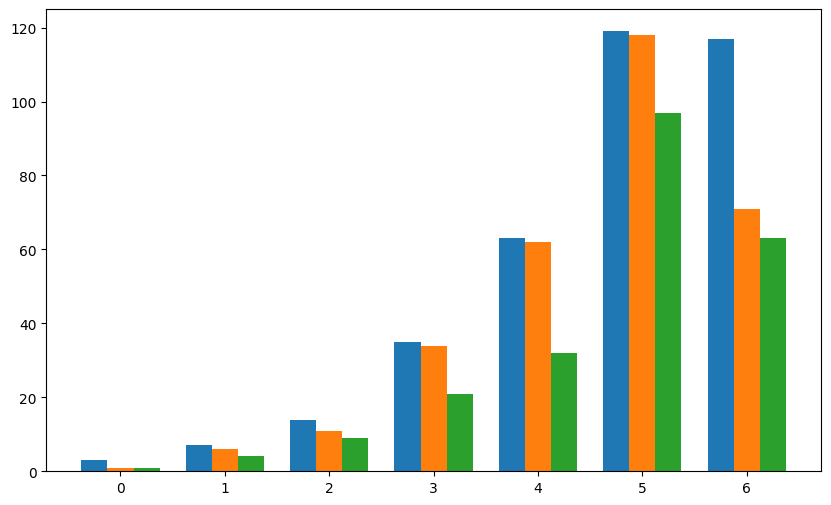

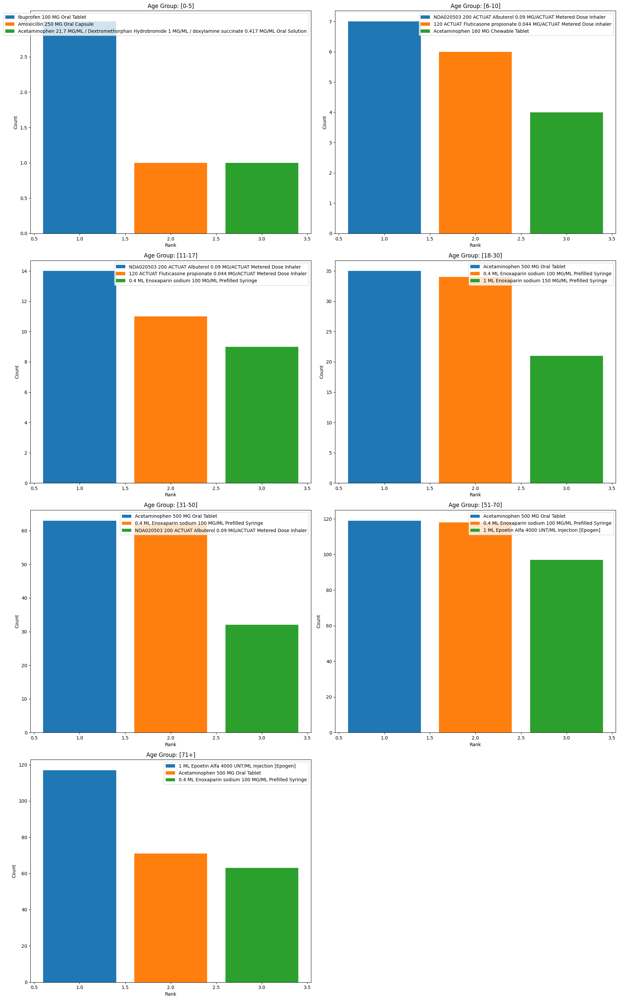

In [0]:
from pyspark.sql import SparkSession
from pyspark import SparkContext

sc = SparkContext.getOrCreate()
notes_rdd = sc.textFile("dbfs:/FileStore/shared_uploads/junlang@hawaii.edu/parsed_notes_jsonl.gz") # it wanted absolute reference
parsed_rdd = notes_rdd.map(json.loads)

def age_to_range(age):
    if 0 <= age <= 5:
        return "[0-5]"
    elif 6 <= age <= 10:
        return "[6-10]"
    elif 11 <= age <= 17:
        return "[11-17]"
    elif 18 <= age <= 30:
        return "[18-30]"
    elif 31 <= age <= 50:
        return "[31-50]"
    elif 51 <= age <= 70:
        return "[51-70]"
    else:
        return "[71+]"

# Extract (age_range, medication) pairs
# Each record might contain multiple medications
age_med_rdd = parsed_rdd.flatMap(lambda record: [
    (age_to_range(record["demographics"]["age"]), med["description"]) 
    for med in record.get("medications", [])
])

# Map to ((age_range, medication), 1) so we can count how often each medication is used in each age range
age_med_pairs = age_med_rdd.map(lambda x: ((x[0], x[1]), 1))

# Count occurrences of each medication per age range
counts_rdd = age_med_pairs.reduceByKey(lambda a, b: a + b)
# Now we have RDD of ((age_range, medication), count)

# Transform this into (age_range, (medication, count)) so we can group by age_range
age_grouped_rdd = counts_rdd.map(lambda x: (x[0][0], (x[0][1], x[1])))

# Group medications by age_range
age_to_meds_rdd = age_grouped_rdd.groupByKey()

# For each age range, we now have an iterable of (medication, count) pairs.
# We can then take the top 3 by count.
def top_3_meds(med_count_pairs):
    # med_count_pairs is an iterable of (med, count)
    # Sort by count descending and take top 3
    return sorted(med_count_pairs, key=lambda x: x[1], reverse=True)[:3]

# Apply the function to each group
top_3_per_age = age_to_meds_rdd.mapValues(top_3_meds)

# Collect and print
results = top_3_per_age.collect()
for age_range, top_meds in sorted(results):
    print(f"Age Range {age_range}:")
    for med, cnt in top_meds:
        print(f"  {med}: {cnt}")

order = ["[0-5]", "[6-10]", "[11-17]", "[18-30]", "[31-50]", "[51-70]", "[71+]"]
order_map = {r: i for i, r in enumerate(order)}
sorted_results = sorted(results, key=lambda x: order_map[x[0]])

age_ranges = [r[0] for r in sorted_results]
# We assume each age range has exactly 3 top meds
# If fewer than 3 meds are available for some age range, you might need to pad them or handle that case.
meds_per_age = [r[1] for r in sorted_results]  # list of lists of (med, count)

# For each medication rank (1st, 2nd, 3rd), extract the medication names and counts across all age ranges
top_med_names = [ [triplet[i][0] for triplet in meds_per_age] for i in range(3) ]
top_med_counts = [ [triplet[i][1] for triplet in meds_per_age] for i in range(3) ]

import matplotlib.pyplot as plt
import numpy as np

# Set up the plot
%matplotlib inline
plt.figure(figsize=(10, 6))

x = np.arange(len(age_ranges))  # Positions for each age range group
width = 0.25  # Width of each bar within a group

# We'll plot each medication rank in a separate bar series
# First medication (top 1)
bar1 = plt.bar(x - width, top_med_counts[0], width, label='Top Med 1')

# Second medication (top 2)
bar2 = plt.bar(x, top_med_counts[1], width, label='Top Med 2')

# Third medication (top 3)
bar3 = plt.bar(x + width, top_med_counts[2], width, label='Top Med 3')

# Add some labels and formatting
plt.figure(figsize=(20, 30))

for i in range(len(age_ranges)):
  ax = plt.subplot(4, 2, i+1)
  ax.bar(1, top_med_counts[0][i], label=top_med_names[0][i])
  ax.bar(2, top_med_counts[1][i], label=top_med_names[1][i])
  ax.bar(3, top_med_counts[2][i], label=top_med_names[2][i])
  ax.set_title(f'Age Group: {age_ranges[i]}')
  ax.set_xlabel('Rank')
  ax.set_ylabel('Count')
  
  ax.legend()
plt.tight_layout()
plt.show()

####Analysis 1: Number of Covid Infections in region and infections per capita

The analytical quesitons:
- Does location (indirectly, population density) affect covid rates?

It appears that in the state of Massachusetts, the population in a city doesn't seem to affect covid infection rates. The high variance in the cities with low populations can be explained by the low sample size, which is evident as the rates seem to converge to around 17 or 18 per 100k as the city population increases.


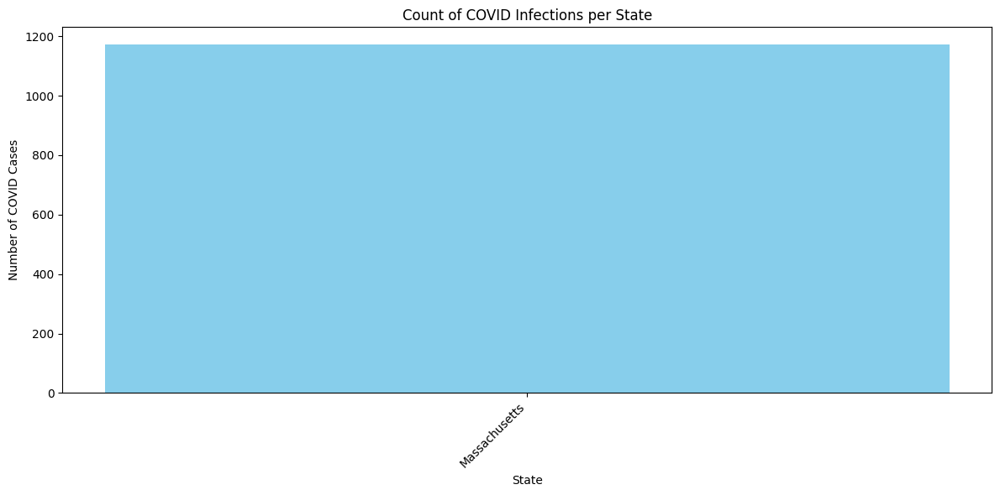

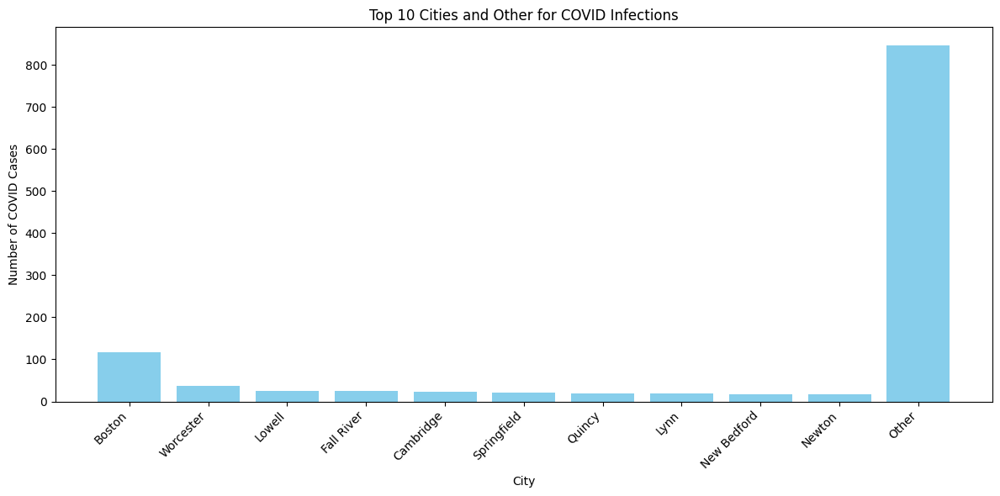

root
 |-- _c0: string (nullable = true)
 |-- _c1: string (nullable = true)
 |-- _c2: string (nullable = true)
 |-- _c3: string (nullable = true)
 |-- _c4: string (nullable = true)
 |-- _c5: string (nullable = true)

+--------------------+------+------+------+------+------+
|                 _c0|   _c1|   _c2|   _c3|   _c4|   _c5|
+--------------------+------+------+------+------+------+
|Agawam Town city,...|28,695|28,626|28,440|28,373|28,406|
|Amesbury Town cit...|17,369|17,341|17,282|17,180|17,303|
|Amherst Town city...|39,263|27,796|40,264|40,124|40,277|
|Attleboro city, M...|46,454|46,475|46,614|46,571|46,654|
|Barnstable Town c...|48,914|48,900|49,613|49,488|49,709|
+--------------------+------+------+------+------+------+
only showing top 5 rows

+-------------+-----+
|         city|count|
+-------------+-----+
|       Boston|  117|
|      Chelsea|    5|
|      Hanover|    3|
|Middleborough|    2|
|      Waltham|   13|
|   Foxborough|    3|
|    Arlington|   10|
|   Fall River|  

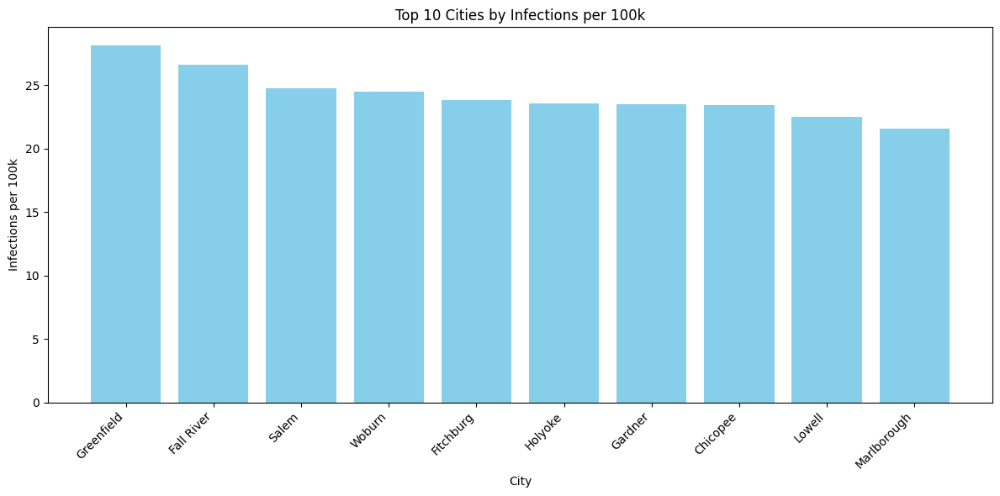

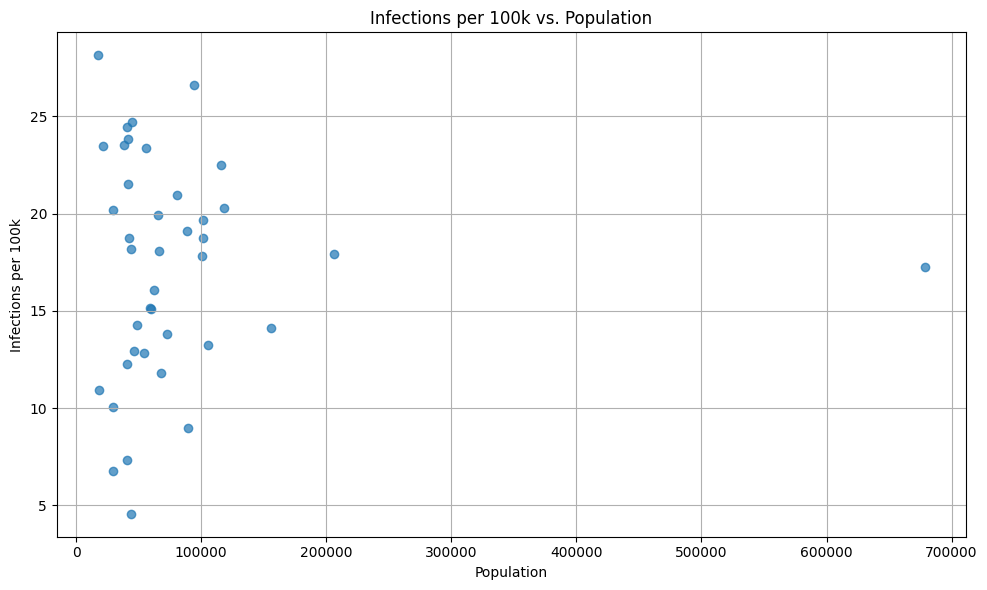

In [0]:
import json
from pyspark.sql import SparkSession
import matplotlib.pyplot as plt
from pyspark.sql.functions import regexp_replace, col
from pyspark.sql.types import IntegerType

spark = SparkSession.builder.getOrCreate()

# Parse the JSON lines into Python dictionaries
# CHANGE THIS LINE SO THAT THE IMPORT NAME MATCHES
notes_rdd = sc.textFile("dbfs:/FileStore/shared_uploads/junlang@hawaii.edu/parsed_notes_jsonl.gz")
parsed_rdd = notes_rdd.map(json.loads)


# Helper function to determine if a record has COVID-19
def is_covid_case(record):
    # Check laboratory results for a detected COVID-19 result
    lab_result = record.get('laboratory', {}).get('covid19', {}).get('result')
    lab_check = (lab_result == "Detected (qualifier value)")
    
    # Return True if either condition code is present or lab result is detected
    return lab_check


# Filter to only COVID cases, using Jubin's filter
covid_rdd = parsed_rdd.filter(is_covid_case)
# covid_rdd = parsed_rdd.filter((f.col('laboratory.covid19.result') == 'Detected (qualifier value)'))

# Extract (state, 1) pairs for counting
state_pairs_rdd = covid_rdd.map(lambda record: (record["demographics"]["address"]["state"], 1))

# Count how many cases per state
state_counts_rdd = state_pairs_rdd.reduceByKey(lambda a, b: a + b)

# Collect the results to the driver
state_counts = state_counts_rdd.collect()

# Sort by state name or by count, depending on preference
# e.g., Sort alphabetically by state:
state_counts.sort(key=lambda x: x[0])

# Separate keys and values for plotting
states = [s for s, c in state_counts]
counts = [c for s, c in state_counts]

# Plot using matplotlib


%matplotlib inline
plt.figure(figsize=(12, 6))
plt.bar(states, counts, color='skyblue')
plt.xlabel("State")
plt.ylabel("Number of COVID Cases")
plt.title("Count of COVID Infections per State")
plt.xticks(rotation=45, ha='right')  # rotate state labels for readability
plt.tight_layout()
plt.show()

# Extract (city, 1) pairs
city_pairs_rdd = covid_rdd.map(lambda record: (record["demographics"]["address"]["city"], 1))

# Count how many cases per city
city_counts_rdd = city_pairs_rdd.reduceByKey(lambda a, b: a + b)

# Collect the results to the driver
city_counts = city_counts_rdd.collect()

# Sort city counts by count in descending order
city_counts.sort(key=lambda x: x[1], reverse=True)

# Take top 10
top_10 = city_counts[:10]

# Aggregate the rest
others = city_counts[10:]

other_total = sum(cnt for c, cnt in others)

# Create a new list with the top 10 plus one "Other" entry
final_data = top_10 + [("Other", other_total)]

# Separate keys and values for plotting
cities = [c for c, cnt in final_data]
counts = [cnt for c, cnt in final_data]

# Plot the bar chart

%matplotlib inline

plt.figure(figsize=(12, 6))
plt.bar(cities, counts, color='skyblue')
plt.xlabel("City")
plt.ylabel("Number of COVID Cases")
plt.title("Top 10 Cities and Other for COVID Infections")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# IMPORT THE CSV
# CHANGE THE PATH after uploading the csv to dbfs
df1 = spark.read.format("csv").option("header", "false").option("skipRows", 5).load("dbfs:/FileStore/shared_uploads/junlang@hawaii.edu/SUB_IP_EST2023_POP_25.csv")
df1.printSchema()
df1.show(5)
df_clean = df1.withColumnRenamed("_c0", "city").withColumnRenamed("_c1", "population")


df_clean = df_clean.withColumn("city", regexp_replace("city", " city, Massachusetts", ""))
city_counts_df = city_counts_rdd.toDF(["city", "count"])
city_counts_df.show()

population_df = df_clean.select(
    col("city"),
    col("population")
)

# fix the type of population column so it's a number
population_df = (population_df
              .withColumn("population", 
                          regexp_replace(col("population"), ",", "").cast(IntegerType())))

joined_df = city_counts_df.join(population_df, on="city", how="inner")
joined_df.show()
result_df = joined_df.withColumn("infections_per_100k", (col("count") / col("population")) * 100000)
result_df.show()

# Convert Spark DataFrame to Pandas
pdf = result_df.toPandas()

# Sort by infections_per_100k descending and select top 10
top10_pdf = pdf.sort_values("infections_per_100k", ascending=False).head(10)

# Bar Graph: infections_per_100k vs city for top 10
import matplotlib.pyplot as plt
%matplotlib inline

plt.figure(figsize=(12, 6))
plt.bar(top10_pdf["city"], top10_pdf["infections_per_100k"], color='skyblue')
plt.xlabel("City")
plt.ylabel("Infections per 100k")
plt.title("Top 10 Cities by Infections per 100k")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Scatter Plot: infections_per_100k vs population
plt.figure(figsize=(10, 6))
plt.scatter(pdf["population"], pdf["infections_per_100k"], alpha=0.7)
plt.xlabel("Population")
plt.ylabel("Infections per 100k")
plt.title("Infections per 100k vs. Population")
plt.grid(True)
plt.tight_layout()
plt.show()


####Analysis 2: Number of Covid Infections over time based on Gender

The analytical quesitons:
- Does the gender impact the spreadness of COVID-19 infections?  
- What's the general trend of the COVID-19 infection over time and are they different based on gender?
- What age groups and gender is more prone to get infected?


This analysis would be valuable to identify if the gender difference impacts the rate of spreadness of COVID-19. Then, if the gender difference is corrleated to number of infections, the more prone gender would be more careful to prevent the transmission.

%md
The top visualization shows the number of COVID-19 infections over time, broken down by gender. There appears to be little to no correlation between gender and the number of infections (or transmission) over time. Both male and female infection rates peaked in March 2020 and declined rapidly afterward, likely due to the global COVID-19 lockdown measures.

The bottom visualization illustrates the number of COVID-19 infections by age group for each gender. It reveals that, in the age groups 0-50, females were more frequently infected than males. However, in the 51+ age group, males experienced higher infection rates than females.

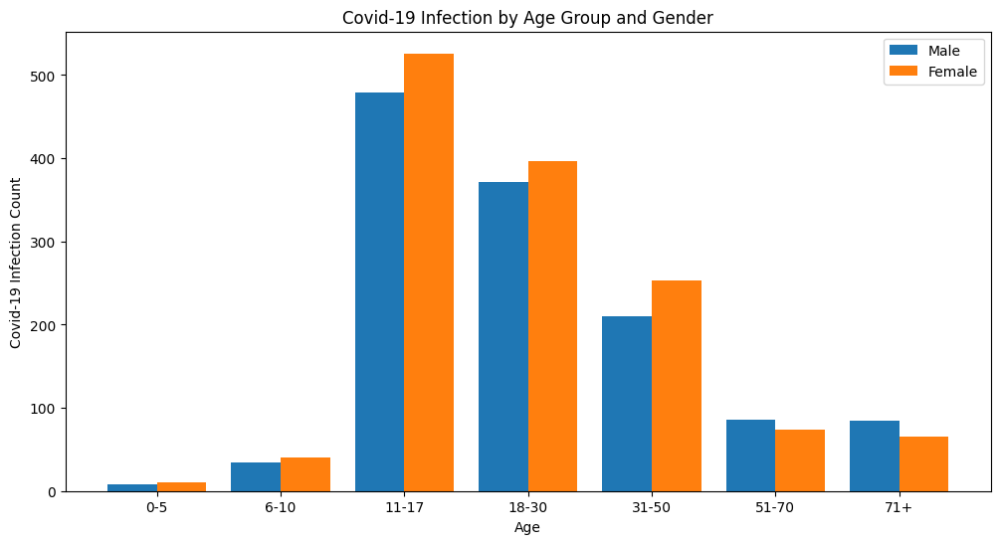

In [0]:
covid_positive_male = covid_positive.filter(f.col('demographics.gender') == 'M')
covid_positive_female = covid_positive.filter(f.col('demographics.gender') == 'F')


covid_0_to_5_female = covid_positive_female.filter((f.col('demographics.age') <= 5)).count()
covid_6_to_10_female = covid_positive_female.filter((f.col('demographics.age') >= 6) & (f.col('demographics.age') <= 10)).count()
covid_11_to_17_female = covid_positive_female.filter((f.col('demographics.age') >= 11) & (f.col('demographics.age') >= 17)).count()
covid_18_to_30_female = covid_positive_female.filter((f.col('demographics.age') >= 18) & (f.col('demographics.age') >= 30)).count()
covid_31_to_50_female = covid_positive_female.filter((f.col('demographics.age') >= 31) & (f.col('demographics.age') >= 50)).count()
covid_51_to_70_female = covid_positive_female.filter((f.col('demographics.age') >= 51) & (f.col('demographics.age') >= 70)).count()
covid_above_71_female = covid_positive_female.filter((f.col('demographics.age') >= 71)).count()

covid_0_to_5_male = covid_positive_male.filter((f.col('demographics.age') <= 5)).count()
covid_6_to_10_male = covid_positive_male.filter((f.col('demographics.age') >= 6) & (f.col('demographics.age') <= 10)).count()
covid_11_to_17_male = covid_positive_male.filter((f.col('demographics.age') >= 11) & (f.col('demographics.age') >= 17)).count()
covid_18_to_30_male = covid_positive_male.filter((f.col('demographics.age') >= 18) & (f.col('demographics.age') >= 30)).count()
covid_31_to_50_male = covid_positive_male.filter((f.col('demographics.age') >= 31) & (f.col('demographics.age') >= 50)).count()
covid_51_to_70_male = covid_positive_male.filter((f.col('demographics.age') >= 51) & (f.col('demographics.age') >= 70)).count()
covid_above_71_male = covid_positive_male.filter((f.col('demographics.age') >= 71)).count()

covid_count_female = [covid_0_to_5_female, covid_6_to_10_female, covid_11_to_17_female, covid_18_to_30_female, covid_31_to_50_female, covid_51_to_70_female, covid_above_71_female]

covid_count_male = [covid_0_to_5_male, covid_6_to_10_male, covid_11_to_17_male, covid_18_to_30_male, covid_31_to_50_male, covid_51_to_70_male, covid_above_71_male]

X_axis = np.arange(len(age_group))

plt.figure(figsize=(12, 6))

plt.bar(X_axis-0.2, covid_count_male, 0.4, label='Male')
plt.bar(X_axis+0.2, covid_count_female, 0.4, label='Female')
plt.xticks(X_axis, age_group)
plt.xlabel('Age')
plt.ylabel('Covid-19 Infection Count')
plt.title('Covid-19 Infection by Age Group and Gender')

_ = plt.legend()

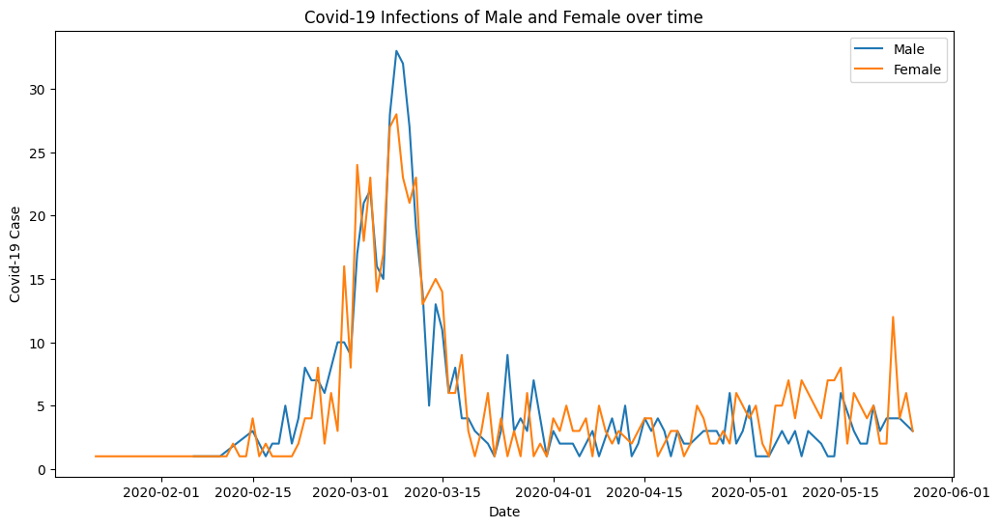

In [0]:
covid_positive_female = covid_positive.filter(f.col('demographics.gender') == 'F')
covid_positive_male = covid_positive.filter(f.col('demographics.gender') == 'M')

covid_per_date_female = covid_positive_female.groupBy(f.col('Encounter.date'))\
  .count().withColumn('covid_date', f.to_date(f.col('date'))).drop('date')\
  .sort('covid_date').collect()

covid_per_date_male = covid_positive_male.groupBy(f.col('Encounter.date'))\
  .count().withColumn('covid_date', f.to_date(f.col('date'))).drop('date')\
  .sort('covid_date').collect()

dates_female = [row["covid_date"] for row in covid_per_date_female]
counts_female = [row["count"] for row in covid_per_date_female]

dates_male = [row["covid_date"] for row in covid_per_date_male]
counts_male = [row["count"] for row in covid_per_date_male]

plt.figure(figsize=(12, 6))
plt.xlabel('Date')
plt.ylabel('Covid-19 Case')
plt.title('Covid-19 Infections of Male and Female over time')

plt.plot(dates_male, counts_male, label='Male')
plt.plot(dates_female, counts_female, label='Female')

_ = plt.legend()

### Top Comorbid Condition Pairs for COVID-19 Positive Patients

#### **Question/Hypothesis**
What are the most frequent **comorbid condition pairs** among COVID-19 positive patients?

---

#### **Why It’s Valuable**
- **Clinical Insights**: Identifying the most common comorbid conditions (e.g., hypertension, pneumonia) helps healthcare providers prioritize treatments and develop targeted care plans for COVID-19 patients.  
- **Resource Allocation**: Understanding which disorders co-occur frequently allows hospitals to allocate resources (e.g., ventilators, medications) more efficiently.  
- **Risk Assessment**: This analysis highlights underlying health conditions that exacerbate COVID-19 severity, enabling better risk stratification for patients.  
- **Public Health Strategy**: Insights into comorbidities help shape public health policies to protect vulnerable populations with specific pre-existing conditions.  
- **Research Foundation**: Results serve as a foundation for further studies on the biological and clinical relationships between COVID-19 and chronic disorders.

---

#### **Methodology**
1. Filter COVID-19 positive patients.  
2. Extract and flatten only conditions containing **"disorder"**.  
3. Create unique condition pairs for patients with multiple disorders, removing duplicates.  
4. Count and rank the most frequent condition pairs.  
5. Visualize the top pairs using a bar chart.  

### Top Medications for COVID-19 Positive Patients

#### **Question/Hypothesis**
What are the **most frequently prescribed medications** for COVID-19 positive patients?

---

#### **Why It’s Valuable**
- **Treatment Patterns**: Identifying the most common medications helps uncover trends in treatment approaches for COVID-19 patients.  
- **Resource Management**: Understanding the demand for specific medications aids healthcare providers and pharmacies in managing supplies effectively.  
- **Clinical Decision-Making**: Highlights critical medications (e.g., for respiratory distress or inflammation) that are consistently prescribed, guiding evidence-based treatment.  
- **Severity Insights**: Frequent use of certain medications (e.g., oxygen support, anticoagulants) can signal trends in disease severity among patients.  
- **Pharmaceutical Insights**: Provides actionable data for pharmaceutical companies and researchers focusing on COVID-19 therapies.

---

#### **Methodology**
1. **Filter** COVID-19 positive patients based on lab results.  
2. **Flatten** the medications array to extract each prescribed medication.  
3. **Count and Rank** medications by frequency to identify the most common ones.  
4. **Visualize** the top 20 medications using a bar chart for clarity.  

### Heatmap of Top Conditions (Disorders) and Medications for COVID-19 Positive Patients

---

#### **Question/Hypothesis**
What are the most frequent **co-occurrences** between common medical disorders and prescribed medications for COVID-19 positive patients?

---

#### **Why It’s Valuable**
- **Treatment Correlation**: Identifies which medications are frequently associated with specific disorders, offering insights into targeted treatments for COVID-19 patients.  
- **Clinical Insight**: Highlights key disorders (e.g., respiratory failure, pneumonia) and the medications used to treat them, helping clinicians prioritize care.  
- **Resource Optimization**: Understanding patterns between conditions and medications enables hospitals to manage medication supplies efficiently.  
- **Severity Analysis**: Disorders like hypoxemia and acute respiratory failure combined with critical medications (e.g., oxygen support or anticoagulants) indicate severe cases.  
- **Research and Policy**: Supports public health research and pharmaceutical policies by revealing common treatment strategies for COVID-19.  

---

#### **Methodology**
1. **Filter** COVID-19 positive patients based on lab results.  
2. **Flatten**:
   - Conditions array and extract only those containing "disorder."
   - Medications array to retrieve individual medications.  
3. **Identify Top 10** conditions and medications based on frequency.  
4. **Join** the top conditions and medications for each patient.  
5. **Create a Cross-Tabulation** to quantify co-occurrences of conditions and medications.  
6. **Visualize** the results as a **heatmap** showing the relationship between top disorders and medications.  

---  


### Correlation Heatmap of Vital Signs and Age  

---

#### **Question/Hypothesis**  
What are the **correlations** between vital signs (e.g., temperature, heart rate, oxygen saturation) and patient age in COVID-19 positive patients?

---

#### **Why It’s Valuable**  
- **Early Detection**: Identifies how age impacts critical vital signs, such as oxygen saturation and respiratory rate, which are key indicators of COVID-19 severity.  
- **Clinical Monitoring**: Helps clinicians understand which vital signs are most affected and correlated, enabling better patient monitoring.  
- **Targeted Care**: Reveals patterns in vitals for older patients who are more vulnerable to severe outcomes, allowing prioritized interventions.  
- **Research Insights**: Supports research on age-related vulnerabilities and their impact on physiological responses to COVID-19.  
- **Resource Planning**: Correlation trends can help allocate monitoring devices, such as pulse oximeters, for at-risk age groups.

---

#### **Methodology**  
1. **Extract** numerical columns related to vital signs and age from the dataset.  
2. **Clean** the data by removing rows with null values to ensure reliable results.  
3. **Calculate** the correlation matrix for the selected vital signs and age.  
4. **Visualize** the correlation matrix as a **heatmap**, highlighting positive or negative relationships between variables.  

---  

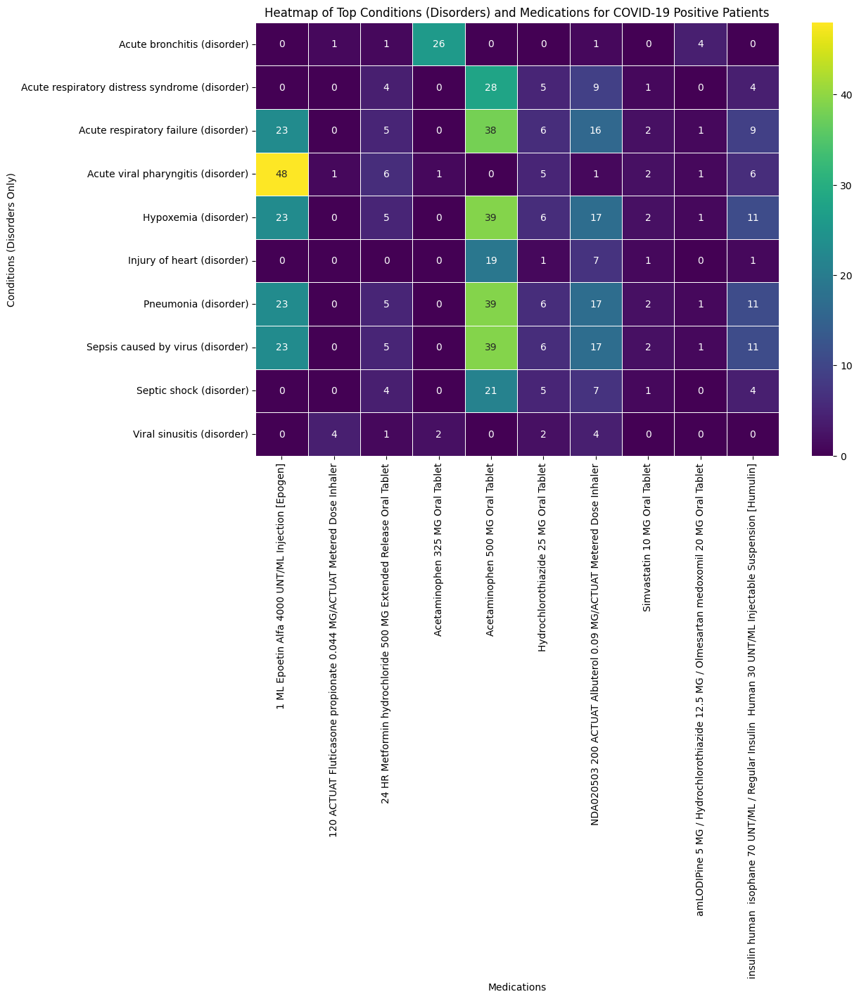

In [0]:
from pyspark.sql import functions as F
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Step 1: Filter COVID-19 positive patients
covid_positive = my_parquet.filter(F.col("laboratory.covid19.result") == "Detected (qualifier value)")

# Step 2: Flatten conditions and filter for 'disorder' only
conditions_flat = covid_positive.select(
    F.col("demographics.name").alias("patient_name"),  # Unique patient identifier
    F.explode("conditions.description").alias("condition_description")
).filter(
    F.col("condition_description").isNotNull() & 
    F.lower(F.col("condition_description")).like("%disorder%")  # Filter for 'disorder'
)

# Step 3: Flatten medications array
medications_flat = covid_positive.select(
    F.col("demographics.name").alias("patient_name"), 
    F.explode("medications.description").alias("medication_description")
).filter(F.col("medication_description").isNotNull())

# Step 4: Count the most common conditions (disorders)
common_conditions = conditions_flat.groupBy("condition_description").count().orderBy(F.desc("count"))
top_conditions = common_conditions.limit(10).select("condition_description")

# Step 5: Count the most common medications
common_medications = medications_flat.groupBy("medication_description").count().orderBy(F.desc("count"))
top_medications = common_medications.limit(10).select("medication_description")

# Step 6: Join conditions and medications on patient_name
conditions_medications_flat = conditions_flat.join(
    medications_flat, 
    on="patient_name", 
    how="inner"
)

# Step 7: Filter for top conditions and top medications
filtered_conditions_medications = conditions_medications_flat.filter(
    F.col("condition_description").isin([row["condition_description"] for row in top_conditions.collect()]) &
    F.col("medication_description").isin([row["medication_description"] for row in top_medications.collect()])
)

# Step 8: Create a cross-tabulation of filtered data
conditions_medications_ct = filtered_conditions_medications.groupBy(
    "condition_description", "medication_description"
).count().toPandas()

# Step 9: Pivot the data for the heatmap
pivot_data = conditions_medications_ct.pivot(
    index="condition_description", 
    columns="medication_description", 
    values="count"
).fillna(0)

# Step 10: Plot the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_data, cmap="viridis", annot=True, fmt=".0f", linewidths=0.5)
plt.xlabel("Medications")
plt.ylabel("Conditions (Disorders Only)")
plt.title("Heatmap of Top Conditions (Disorders) and Medications for COVID-19 Positive Patients")
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.show()
